# <center> Trends in National Availability of Medical Providers: <br>A Comprehensive Analysis of Medicare Enrollment Data</br>

<center><br>Nikki Fahrenthold</br>
<br>ADTA 5900: Capstone </br>
<br>Dr. Sarah Quintanar </br></center>

In [1]:
# data preprocessing

# fix spelling errors in Excel for city names by cross-verifying using google 

## Research Question 1: When looking specifically at Texas, are there areas (cities) that are understaffed by any specialty? 

In [1]:
# import required packages

import numpy as np
import pandas as pd

# utilized data pre-filtered by CMS due to size and complexity
# visualize in a table

texas_data = pd.read_csv('texas_data.csv')

# rename city/town column to 'city'
texas_data.rename(columns={'City/Town': 'city'}, inplace=True)

texas_data

C:\Users\Nikki Fahrenthold\AppData\Local\Temp\ipykernel_21408\1673758844.py:9: DtypeWarning: Columns (23) have mixed types. Specify dtype option on import or set low_memory=False.
  texas_data = pd.read_csv('texas_data.csv')


,NPI,Provider Last Name,Provider First Name,Provider Middle Name,gndr,Cred,Med_sch,Grd_yr,pri_spec,sec_spec_1,...,Telehlth,Facility Name,org_pac_id,num_org_mem,adr_ln_1,adr_ln_2,ln_2_sprs,city,State,ZIP Code
0,1407852924,MELTON,TIMOTHY,S,M,DC,OTHER,1999.0,CHIROPRACTIC,NaN,...,NaN,NaN,NaN,NaN,4601 BUFFALO GAP RD,SUITE C 1,NaN,ABILENE,TX,796053363
1,1073940482,ATHA,JAMES,CARL,M,CNA,OTHER,2013.0,CERTIFIED REGISTERED NURSE ANESTHETIST (CRNA),NaN,...,NaN,PATRIOT ANESTHESIA,6.608139e+09,4.0,1007 2ND ST,NaN,NaN,ABERNATHY,TX,793113615
2,1275512006,NICK,MICHAEL,L,M,CNA,OTHER,1999.0,CERTIFIED REGISTERED NURSE ANESTHETIST (CRNA),NaN,...,NaN,PATRIOT ANESTHESIA,6.608139e+09,4.0,1007 2ND ST,NaN,NaN,ABERNATHY,TX,793113615
3,1659853620,CORTEZ,MARIA,J,F,NP,OTHER,2018.0,NURSE PRACTITIONER,NaN,...,NaN,COVENANT MEDICAL GROUP,6.901889e+09,215.0,409 8TH ST,NaN,NaN,ABERNATHY,TX,793113416
4,1881928299,BLACK,KELLY,J,M,CNA,OTHER,2009.0,CERTIFIED REGISTERED NURSE ANESTHETIST (CRNA),NaN,...,NaN,PATRIOT ANESTHESIA,6.608139e+09,4.0,1007 2ND ST,NaN,NaN,ABERNATHY,TX,793113615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176727,1740517218,DIAZ-FORNO,LAURA,E,F,NaN,OTHER,2000.0,MENTAL HEALTH COUNSELOR,NaN,...,NaN,BORDER REGION MH MR COMMUNITY CENTER,6.482074e+08,16.0,101 1ST ST,NaN,NaN,ZAPATA,TX,780763319
176728,1760762728,MEYERS,ROYCE,LEON,M,PT,OTHER,1954.0,PHYSICAL THERAPY,NaN,...,NaN,"ZAPATA REHABILITATION CENTER, PC",4.385635e+09,2.0,2113 N US HWY 83,NaN,NaN,ZAPATA,TX,780763588
176729,1891405460,ARGUELLES,OLGA,M,F,NP,OTHER,2022.0,NURSE PRACTITIONER,NaN,...,NaN,BORDER REGION MH MR COMMUNITY CENTER,6.482074e+08,16.0,101 1ST ST,NaN,NaN,ZAPATA,TX,780763319
176730,1952657025,HEARD,LISA,H,F,NP,OTHER,2010.0,NURSE PRACTITIONER,NaN,...,NaN,REGIONAL EMPLOYEE ASSISTANCE PROGRAM INC,1.557260e+09,91.0,801 N US HWY 83,NaN,NaN,ZAPATA,TX,780763290


In [3]:
numerical_summary = texas_data.describe()
print("Summary statistics for numerical variables:")
print(numerical_summary)

# For categorical variables
categorical_summary = texas_data.describe(include=['object', 'category'])
print("\nSummary statistics for categorical variables:")
print(categorical_summary)

# Additional statistics for categorical variables
categorical_columns = texas_data.select_dtypes(include=['object', 'category']).columns
for column in categorical_columns:
    print(f"\nValue counts for {column}:")
    print(texas_data[column].value_counts())

Summary statistics for numerical variables:
                NPI         Grd_yr    org_pac_id   num_org_mem
count  1.767320e+05  176598.000000  1.651950e+05  165195.00000
mean   1.499398e+09    2005.469881  5.164217e+09     738.36245
std    2.874151e+08      12.020033  2.837829e+09     868.31208
min    1.003001e+09    1951.000000  4.210833e+07       2.00000
25%    1.245763e+09    1998.000000  3.072427e+09      38.00000
50%    1.508068e+09    2008.000000  5.193711e+09     282.00000
75%    1.740678e+09    2015.000000  7.911801e+09    1403.00000
max    1.992999e+09    2026.000000  9.931590e+09    5124.00000

Summary statistics for categorical variables:
       Provider Last Name Provider First Name Provider Middle Name    gndr  \
count              176731              176731               118400  176732   
unique              35313               16656                 6347       3   
top                 PATEL             MICHAEL                    A       M   
freq                 1313     

sec_spec_all
INTERNAL MEDICINE                                                                                      8695
CARDIOVASCULAR DISEASE (CARDIOLOGY)                                                                    1409
CRITICAL CARE (INTENSIVISTS)                                                                           1009
HOSPITALIST                                                                                             920
GENERAL SURGERY                                                                                         854
                                                                                                       ... 
NEUROPSYCHIATRY, NEUROSURGERY                                                                             1
ENDOCRINOLOGY, INTERNAL MEDICINE                                                                          1
ORAL SURGERY, SURGICAL ONCOLOGY                                                                           1
NEUROLOGY, OSTE

In [4]:
def count_physicians_in_city(df, city_name):
    # Filter the dataframe for the given city
    city_data = df[df['city'] == city_name]
    # Count the unique NPI values in the filtered dataframe
    num_physicians = city_data['NPI'].nunique()
    return num_physicians

# sort physicians by city and aggregate, then sort by lowest

def physicians_by_city(df):
    # Group by city and count unique NPIs
    city_counts = df.groupby('city')['NPI'].nunique().reset_index()
    city_counts.columns = ['City', 'Number of Physicians']
    # Sort by the number of physicians in ascending order
    sorted_city_counts = city_counts.sort_values(by='Number of Physicians', ascending=False).head(50)
    return sorted_city_counts

# Example usage
city_physician_counts = physicians_by_city(texas_data)
print(city_physician_counts)

                City  Number of Physicians
301          HOUSTON                 15806
157           DALLAS                  9409
567      SAN ANTONIO                  7609
31            AUSTIN                  6050
222       FORT WORTH                  4651
514            PLANO                  3040
626       SUGAR LAND                  2478
190          EL PASO                  2336
661            TYLER                  2135
639           TEMPLE                  2020
558       ROUND ROCK                  1789
228           FRISCO                  1589
25         ARLINGTON                  1423
139   CORPUS CHRISTI                  1414
402          LUBBOCK                  1411
428         MCKINNEY                  1323
318           IRVING                  1230
595       SHENANDOAH                  1071
333             KATY                  1053
166           DENTON                  1028
1            ABILENE                   998
17          AMARILLO                   991
540       R

The cities with the greatest number of physicians are major metropolitan areas, with the next greatest occurring in suburbs of those major metropolitan areas.

## Are there areas (cities) of Texas that do not have any members of a given specialty?

In [5]:
def find_missing_specialties(df, city):
    # Get unique specialties in the dataframe
    all_specialties = set(df['pri_spec'].unique())

    # Get specialties that occur in the given city
    specialties_in_city = set(df.loc[df['city'] == city, 'pri_spec'].unique())

    # Find specialties that do not occur in the given city
    missing_specialties = all_specialties - specialties_in_city

    return missing_specialties

def find_missing_specialties_for_all_cities(df):
    # Get unique cities in the dataframe
    cities = df['city'].unique()

    # Initialize dictionary to store missing specialties for each city
    missing_specialties_by_city = {}

    # Iterate over each city and find missing specialties
    for city in cities:
        missing_specialties = find_missing_specialties(df, city)
        missing_specialties_by_city[city] = missing_specialties

    return missing_specialties_by_city

# Example usage
missing_specialties_by_city = find_missing_specialties_for_all_cities(texas_data)

# Print results
for city, missing_specialties in missing_specialties_by_city.items():
    if missing_specialties:
        print(f"City: {city}, Missing Specialties: {missing_specialties}")
    else:
        print(f"City: {city}, All specialties present")

City: ABILENE, Missing Specialties: {'PERIPHERAL VASCULAR DISEASE', 'UNDEFINED PHYSICIAN TYPE (SPECIFY)', 'VASCULAR SURGERY', 'HEMATOPOIETIC CELL TRANSPLANTATION AND CELLULAR THERAPY', 'ANESTHESIOLOGY ASSISTANT', 'MEDICAL GENETICS AND GENOMICS', 'GERIATRIC PSYCHIATRY', 'SLEEP MEDICINE', 'MICROGRAPHIC DERMATOLOGIC SURGERY (MDS)', 'HEMATOLOGY', 'OSTEOPATHIC MANIPULATIVE MEDICINE', 'GERIATRIC MEDICINE', 'PREVENTIVE MEDICINE', 'MAXILLOFACIAL SURGERY', 'DENTIST', 'NUCLEAR MEDICINE', 'NEUROPSYCHIATRY', 'GYNECOLOGICAL ONCOLOGY', 'ADULT CONGENITAL HEART DISEASE (ACHD)', 'ADDICTION MEDICINE', 'ADVANCED HEART FAILURE AND TRANSPLANT CARDIOLOGY', 'INTERVENTIONAL RADIOLOGY', 'UNDEFINED NON-PHYSICIAN TYPE (SPECIFY)'}
City: ABERNATHY, Missing Specialties: {'RADIATION ONCOLOGY', 'GENERAL SURGERY', 'DIAGNOSTIC RADIOLOGY', 'HAND SURGERY', 'GASTROENTEROLOGY', 'CLINICAL PSYCHOLOGIST', 'ANESTHESIOLOGY ASSISTANT', 'CARDIAC ELECTROPHYSIOLOGY', 'HEMATOPOIETIC CELL TRANSPLANTATION AND CELLULAR THERAPY', 'PHYSI

In [6]:
def find_missing_specialties(df, city):
    # Get unique specialties in the dataframe
    all_specialties = set(df['pri_spec'].unique())

    # Get specialties that occur in the given city
    specialties_in_city = set(df.loc[df['city'] == city, 'pri_spec'].unique())

    # Find specialties that do not occur in the given city
    missing_specialties = all_specialties - specialties_in_city

    return missing_specialties

def find_missing_specialties_for_all_cities(df):
    # Get unique cities in the dataframe
    cities = df['city'].unique()

    # Initialize dictionary to store missing specialties count for each city
    missing_specialties_counts = {}

    # Iterate over each city and find missing specialties count
    for city in cities:
        missing_specialties = find_missing_specialties(df, city)
        missing_specialties_counts[city] = len(missing_specialties)

    # Convert dictionary to a dataframe for easier display
    missing_specialties_df = pd.DataFrame(list(missing_specialties_counts.items()), columns=['City', 'Missing Specialties Count'])

    # Sort dataframe by 'Missing Specialties Count' in descending order
    missing_specialties_df = missing_specialties_df.sort_values(by='Missing Specialties Count', ascending=False)

    return missing_specialties_df

# Example usage
missing_specialties_by_city = find_missing_specialties_for_all_cities(texas_data)

# Print the sorted dataframe
print(missing_specialties_by_city)


            City  Missing Specialties Count
718      ZAVALLA                         85
464         NASH                         85
140    CORISCANA                         85
142     CORRIGAN                         85
145     CRANDALL                         85
..           ...                        ...
224   FORT WORTH                         13
31        AUSTIN                          9
159       DALLAS                          7
302      HOUSTON                          6
556  SAN ANTONIO                          5

[719 rows x 2 columns]


In [7]:
# Filter the dataframe to count cities with a 'Missing Specialties Count' of 85
count_of_cities_with_85_missing_specialties = missing_specialties_by_city[missing_specialties_by_city['Missing Specialties Count'] == 85].shape[0]

print(f"Number of cities with a 'Missing Specialties Count' of 85: {count_of_cities_with_85_missing_specialties}")

Number of cities with a 'Missing Specialties Count' of 85: 125


In [8]:
# Group by city and count unique NPIs
city_counts = texas_data.groupby('city')['NPI'].nunique().reset_index()
city_counts.columns = ['City', 'Number of Physicians']

# Set display options to view all rows
pd.set_option('display.max_rows', None)

# Create a new column for the range groups (multiples of 10)
city_counts = texas_data.groupby('city')['NPI'].nunique().reset_index()
city_counts.columns = ['City', 'Number of Physicians']

# Create a new column for the range groups (multiples of 10)
city_counts['Range'] = (city_counts['Number of Physicians'] // 10) * 10

# Group by the range and count the number of cities in each range
range_counts = city_counts.groupby('Range').size().reset_index(name='Number of Cities')

# Sort by the range
sorted_range_counts = range_counts.sort_values(by='Range')

# Print the entire dataframe as a string
print(sorted_range_counts.to_string(index=False))

 Range  Number of Cities
     0               306
    10                88
    20                49
    30                37
    40                34
    50                17
    60                18
    70                10
    80                 7
    90                 5
   100                 4
   110                 5
   120                 4
   130                 8
   140                 3
   150                 5
   160                 2
   170                 2
   180                 5
   190                 4
   200                 3
   210                 5
   220                 1
   230                 2
   240                 2
   250                 2
   260                 1
   270                 3
   280                 2
   290                 1
   300                 4
   310                 3
   320                 2
   330                 1
   360                 1
   370                 5
   390                 2
   410                 1
   420                 1


The majority of cities have between 1 and 10 physicians, with the majority of cities in Texas having between 1-79.

In [9]:
# Determine the average number of physicians per city

# Group by city and count unique NPIs
city_counts = texas_data.groupby('city')['NPI'].nunique().reset_index()
city_counts.columns = ['City', 'Number of Physicians']

# Calculate the average number of physicians per city
average_physicians_per_city = city_counts['Number of Physicians'].mean()

print(f"The average number of physicians per city is {average_physicians_per_city:.2f}.")

The average number of physicians per city is 176.36.


https://www.indexmundi.com/facts/united-states/quick-facts/texas/percent-of-people-of-all-ages-in-poverty/cities#chart

The cities with the highest rate of poverty (percentage of the population) = Prairie View (52.5%), Mila Doce (51.7%), Cameron Park (45.3%).

In [10]:
# identify the numbers of physicians in these cities

# Define the cities to filter
cities_to_filter = ['Prairie View', 'Mila Doce', 'Cameron Park']

# Filter the dataframe to include only the specified cities
filtered_data = texas_data[texas_data['city'].isin(cities_to_filter)]

print(filtered_data)

Empty DataFrame
Columns: [NPI, Provider Last Name, Provider First Name, Provider Middle Name, gndr, Cred, Med_sch, Grd_yr, pri_spec, sec_spec_1, sec_spec_2, sec_spec_3, sec_spec_4, sec_spec_all, Telehlth, Facility Name, org_pac_id, num_org_mem, adr_ln_1, adr_ln_2, ln_2_sprs, city, State, ZIP Code]
Index: []

[0 rows x 24 columns]


There are no listed, enrolled Medicare participants in the 3 cities with the highest percentage of citizens living in poverty.

## When comparing graduation rates (Grd_yr) for each given specialty, is there a positive, negative, or no trend from year-to-year in terms of new Medicare-affiliated members looking towards the present?

C:\Users\Nikki Fahrenthold\AppData\Local\Temp\ipykernel_12588\2687310204.py:54: RankWarning: Polyfit may be poorly conditioned
  plot_physicians_by_specialty(texas_data)
C:\Users\Nikki Fahrenthold\AppData\Local\Temp\ipykernel_12588\2687310204.py:54: RankWarning: Polyfit may be poorly conditioned
  plot_physicians_by_specialty(texas_data)


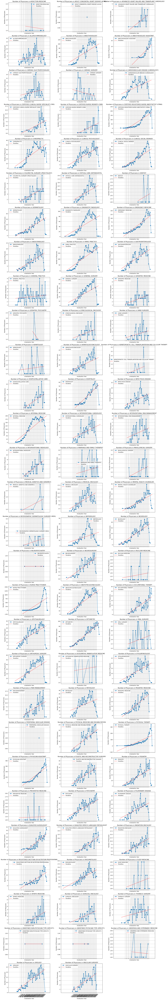

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def plot_physicians_by_specialty(df):
    # Drop duplicate NPIs
    df = df.drop_duplicates(subset='NPI')

    # Group by specialty and graduation year, count occurrences
    specialty_counts = df.groupby(['pri_spec', 'Grd_yr']).size().reset_index(name='Count')

    # Plotting each specialty separately
    specialties = specialty_counts['pri_spec'].unique()
    num_specialties = len(specialties)
    
    # Calculate number of rows and columns for subplots
    num_cols = 3
    num_rows = (num_specialties + num_cols - 1) // num_cols  # Ensure enough rows for all specialties

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(18, 4*num_rows), sharex=True)

    for i, specialty in enumerate(specialties):
        row = i // num_cols
        col = i % num_cols

        data = specialty_counts[specialty_counts['pri_spec'] == specialty]
        axs[row, col].plot(data['Grd_yr'], data['Count'], marker='o', label=specialty)

        # Add trendline
        z = np.polyfit(data['Grd_yr'], data['Count'], 1)
        p = np.poly1d(z)
        axs[row, col].plot(data['Grd_yr'], p(data['Grd_yr']), "r--", label='Trendline')

        axs[row, col].set_title(f'Number of Physicians in {specialty}')
        axs[row, col].set_xlabel('Graduation Year')
        axs[row, col].set_ylabel('Number of Physicians')
        axs[row, col].legend()
        axs[row, col].grid(True)
        
        # Set x-axis ticks and labels every 1 year
        axs[row, col].set_xticks(data['Grd_yr'].unique())
        axs[row, col].set_xticklabels(data['Grd_yr'].unique(), rotation=45)  # Rotate labels for better visibility

    # Hide empty subplots if any
    for i in range(num_specialties, num_rows * num_cols):
        row = i // num_cols
        col = i % num_cols
        axs[row, col].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
plot_physicians_by_specialty(texas_data)

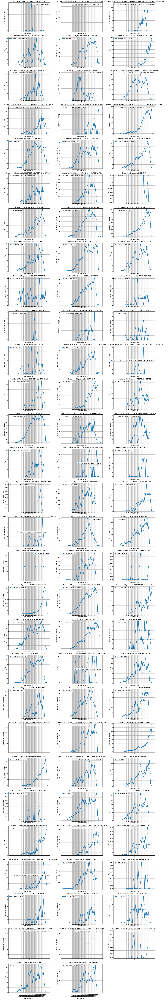

In [12]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_physicians_by_specialty(df):
    # Drop duplicate NPIs
    df = df.drop_duplicates(subset='NPI')

    # Group by specialty and graduation year, count occurrences
    specialty_counts = df.groupby(['pri_spec', 'Grd_yr']).size().reset_index(name='Count')

    # Plotting each specialty separately
    specialties = specialty_counts['pri_spec'].unique()
    num_specialties = len(specialties)
    
    # Calculate number of rows and columns for subplots
    num_cols = 3
    num_rows = (num_specialties + num_cols - 1) // num_cols  # Ensure enough rows for all specialties

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(18, 4*num_rows), sharex=True)

    for i, specialty in enumerate(specialties):
        row = i // num_cols
        col = i % num_cols

        data = specialty_counts[specialty_counts['pri_spec'] == specialty]
        axs[row, col].plot(data['Grd_yr'], data['Count'], marker='o', label=specialty)
        axs[row, col].set_title(f'Number of Physicians in {specialty}')
        axs[row, col].set_xlabel('Graduation Year')
        axs[row, col].set_ylabel('Number of Physicians')
        axs[row, col].legend()
        axs[row, col].grid(True)
        
        # Set x-axis ticks and labels every 1 year
        axs[row, col].set_xticks(data['Grd_yr'].unique())
        axs[row, col].set_xticklabels(data['Grd_yr'].unique(), rotation=45)  # Rotate labels for better visibility

    # Hide empty subplots if any
    for i in range(num_specialties, num_rows * num_cols):
        row = i // num_cols
        col = i % num_cols
        axs[row, col].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
plot_physicians_by_specialty(texas_data)

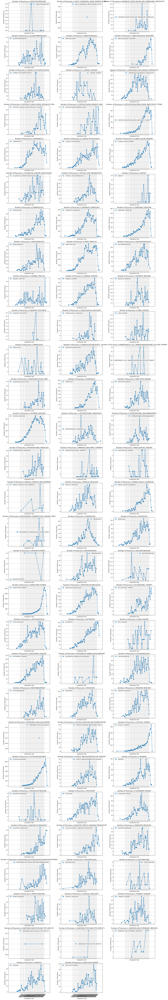

In [13]:
# compare grad rates for specialties
# visualize in a line graph, with each specialty having its own graph, x axis is year, and y axis is amount of graduates

import pandas as pd
import matplotlib.pyplot as plt

def plot_physicians_by_specialty(df):
    # Group by specialty and graduation year, count occurrences
    specialty_counts = df.groupby(['pri_spec', 'Grd_yr']).size().reset_index(name='Count')

    # Plotting each specialty separately
    specialties = specialty_counts['pri_spec'].unique()
    num_specialties = len(specialties)
    
    # Calculate number of rows and columns for subplots
    num_cols = 3
    num_rows = (num_specialties + num_cols - 1) // num_cols  # Ensure enough rows for all specialties

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(18, 4*num_rows), sharex=True)

    for i, specialty in enumerate(specialties):
        row = i // num_cols
        col = i % num_cols

        data = specialty_counts[specialty_counts['pri_spec'] == specialty]
        axs[row, col].plot(data['Grd_yr'], data['Count'], marker='o', label=specialty)
        axs[row, col].set_title(f'Number of Physicians in {specialty}')
        axs[row, col].set_xlabel('Graduation Year')
        axs[row, col].set_ylabel('Number of Physicians')
        axs[row, col].legend()
        axs[row, col].grid(True)
        
        # Set x-axis ticks and labels every 1 year
        axs[row, col].set_xticks(data['Grd_yr'].unique())
        axs[row, col].set_xticklabels(data['Grd_yr'].unique(), rotation=45)  # Rotate labels for better visibility

    # Hide empty subplots if any
    for i in range(num_specialties, num_rows * num_cols):
        row = i // num_cols
        col = i % num_cols
        axs[row, col].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
plot_physicians_by_specialty(texas_data)


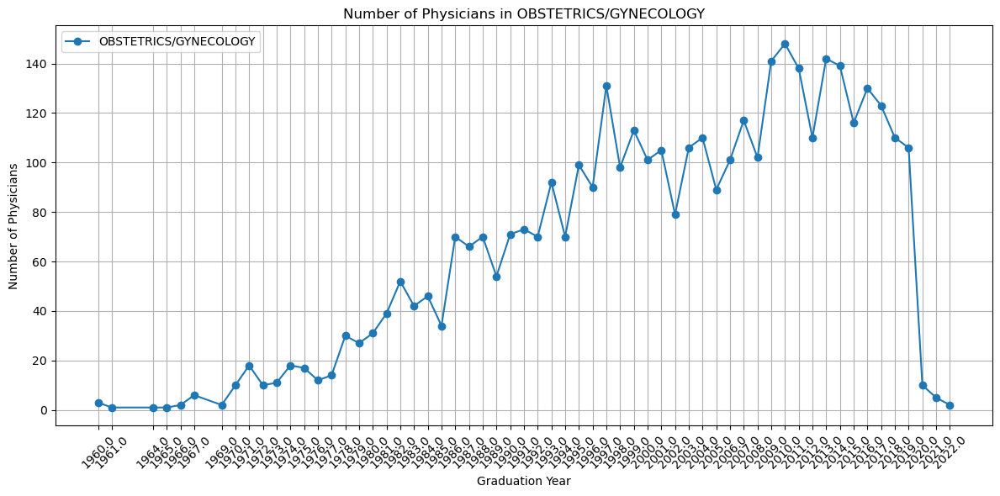

In [14]:
# Code just for OBGYN graduation rates

import pandas as pd
import matplotlib.pyplot as plt

def plot_physicians_by_specialty(df):
    # Group by specialty and graduation year, count occurrences
    specialty_counts = df.groupby(['pri_spec', 'Grd_yr']).size().reset_index(name='Count')

    # Filter data for the specific specialty 'OBSTETRICS/GYNECOLOGY'
    specialty = 'OBSTETRICS/GYNECOLOGY'
    data = specialty_counts[specialty_counts['pri_spec'] == specialty]

    # Plot the line graph for the specialty
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(data['Grd_yr'], data['Count'], marker='o', label=specialty)
    ax.set_title(f'Number of Physicians in {specialty}')
    ax.set_xlabel('Graduation Year')
    ax.set_ylabel('Number of Physicians')
    ax.legend()
    ax.grid(True)
    ax.set_xticks(data['Grd_yr'].unique())
    ax.set_xticklabels(data['Grd_yr'].unique(), rotation=45)

    plt.tight_layout()
    plt.show()

plot_physicians_by_specialty(texas_data)


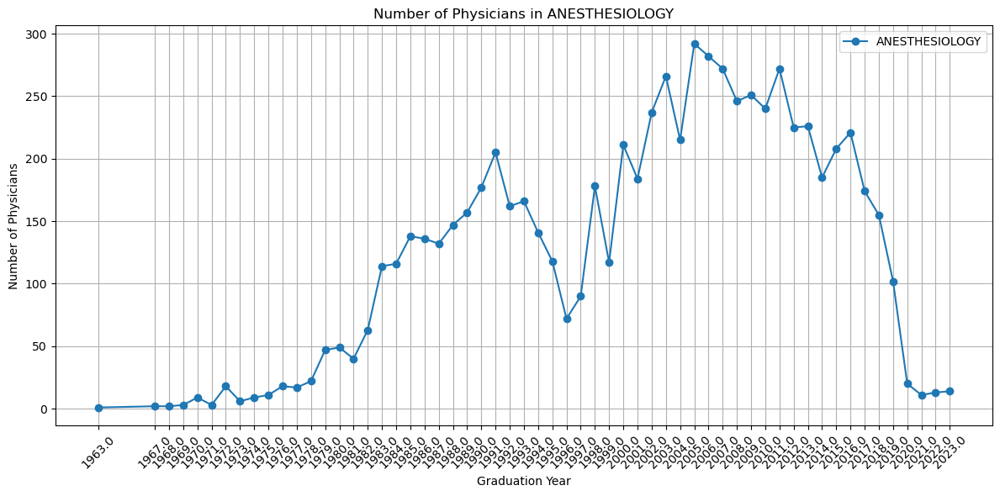

In [15]:
# Code just for anesthesiology graduation rates

import pandas as pd
import matplotlib.pyplot as plt

def plot_physicians_by_specialty(df):
    # Group by specialty and graduation year, count occurrences
    specialty_counts = df.groupby(['pri_spec', 'Grd_yr']).size().reset_index(name='Count')

    # Filter data for the specific specialty 'ANESTHESIOLOGY'
    specialty = 'ANESTHESIOLOGY'
    data = specialty_counts[specialty_counts['pri_spec'] == specialty]

    # Plot the line graph for the specialty
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(data['Grd_yr'], data['Count'], marker='o', label=specialty)
    ax.set_title(f'Number of Physicians in {specialty}')
    ax.set_xlabel('Graduation Year')
    ax.set_ylabel('Number of Physicians')
    ax.legend()
    ax.grid(True)
    ax.set_xticks(data['Grd_yr'].unique())
    ax.set_xticklabels(data['Grd_yr'].unique(), rotation=45)

    plt.tight_layout()
    plt.show()

plot_physicians_by_specialty(texas_data)


## For each given specialty, where is that physician most likely to practice?

In [16]:
def predict_specialty_location(texas_data):
    # Group by specialty and city, count occurrences
    specialty_city_counts = texas_data.groupby(['pri_spec', 'city']).size().reset_index(name='Count')

    # Find the city with the highest count for each specialty
    idx = specialty_city_counts.groupby(['pri_spec'])['Count'].transform(max) == specialty_city_counts['Count']
    most_common_cities = specialty_city_counts[idx]

    return most_common_cities

# Example usage
most_common_cities_per_specialty = predict_specialty_location(texas_data)

# Print the results
print("Specialty Location Predictions:")
print(most_common_cities_per_specialty)

Specialty Location Predictions:
                                                pri_spec         city  Count
3                                     ADDICTION MEDICINE      HOUSTON      5
8                  ADULT CONGENITAL HEART DISEASE (ACHD)       AUSTIN      1
20      ADVANCED HEART FAILURE AND TRANSPLANT CARDIOLOGY      HOUSTON     28
77                                    ALLERGY/IMMUNOLOGY      HOUSTON     71
191                                       ANESTHESIOLOGY      HOUSTON   1453
289                             ANESTHESIOLOGY ASSISTANT      HOUSTON    267
353                            CARDIAC ELECTROPHYSIOLOGY      HOUSTON     84
418                                      CARDIAC SURGERY      HOUSTON     37
560                  CARDIOVASCULAR DISEASE (CARDIOLOGY)      HOUSTON    628
699            CERTIFIED CLINICAL NURSE SPECIALIST (CNS)       AUSTIN    113
776                        CERTIFIED NURSE MIDWIFE (CNM)      HOUSTON     16
888        CERTIFIED REGISTERED NURSE ANESTH

In [17]:
# Step 2: Remove duplicate entries based on 'NPI'
unique_npi_data = texas_data.drop_duplicates(subset='NPI')

# Step 3: Calculate the average graduation year
average_graduation_year = unique_npi_data['Grd_yr'].mean()

print(f"The average graduation year, considering only unique NPIs, is: {average_graduation_year:.2f}")

The average graduation year, considering only unique NPIs, is: 2005.70


In [18]:
lowest_graduation_year = texas_data['Grd_yr'].min()

print(f"The lowest graduation year is: {lowest_graduation_year}")

The lowest graduation year is: 1951.0


In [19]:
filtered_data = texas_data[(texas_data['Grd_yr'] >= 1950) & (texas_data['Grd_yr'] <= 1980)]

# Step 3: Count unique NPIs in the filtered dataset
unique_npi_count = filtered_data['NPI'].nunique()

print(f"The number of unique NPIs from 1950 to 1980 is: {unique_npi_count}")

The number of unique NPIs from 1950 to 1980 is: 3408


In [20]:
unique_npi_count = texas_data['NPI'].nunique()

print(f"The number of unique NPIs in the dataset is: {unique_npi_count}")

The number of unique NPIs in the dataset is: 87030


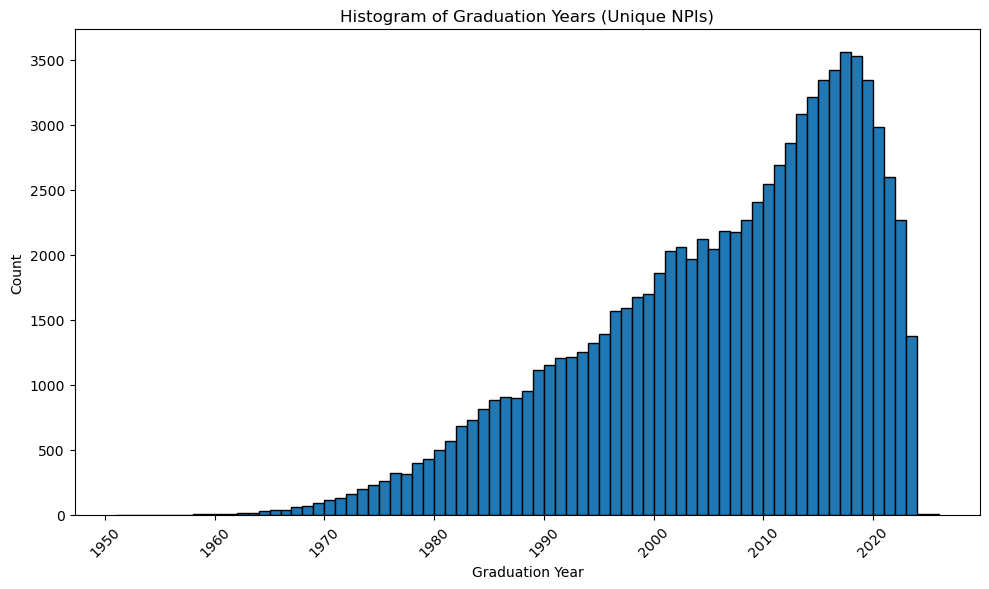

In [21]:

# Step 2: Remove duplicate entries based on 'NPI'
unique_npi_data = texas_data.drop_duplicates(subset='NPI')

# Step 3: Create a histogram of graduation years (Grd_yr) using the unique NPI data
min_year = int(unique_npi_data['Grd_yr'].min())
max_year = int(unique_npi_data['Grd_yr'].max())

plt.figure(figsize=(10, 6))
plt.hist(unique_npi_data['Grd_yr'], bins=range(min_year, max_year + 1), edgecolor='black')
plt.xlabel('Graduation Year')
plt.ylabel('Count')
plt.title('Histogram of Graduation Years (Unique NPIs)')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent clipping of labels

# Step 4: Display the histogram
plt.show()

## Are gender and specialty correlated?

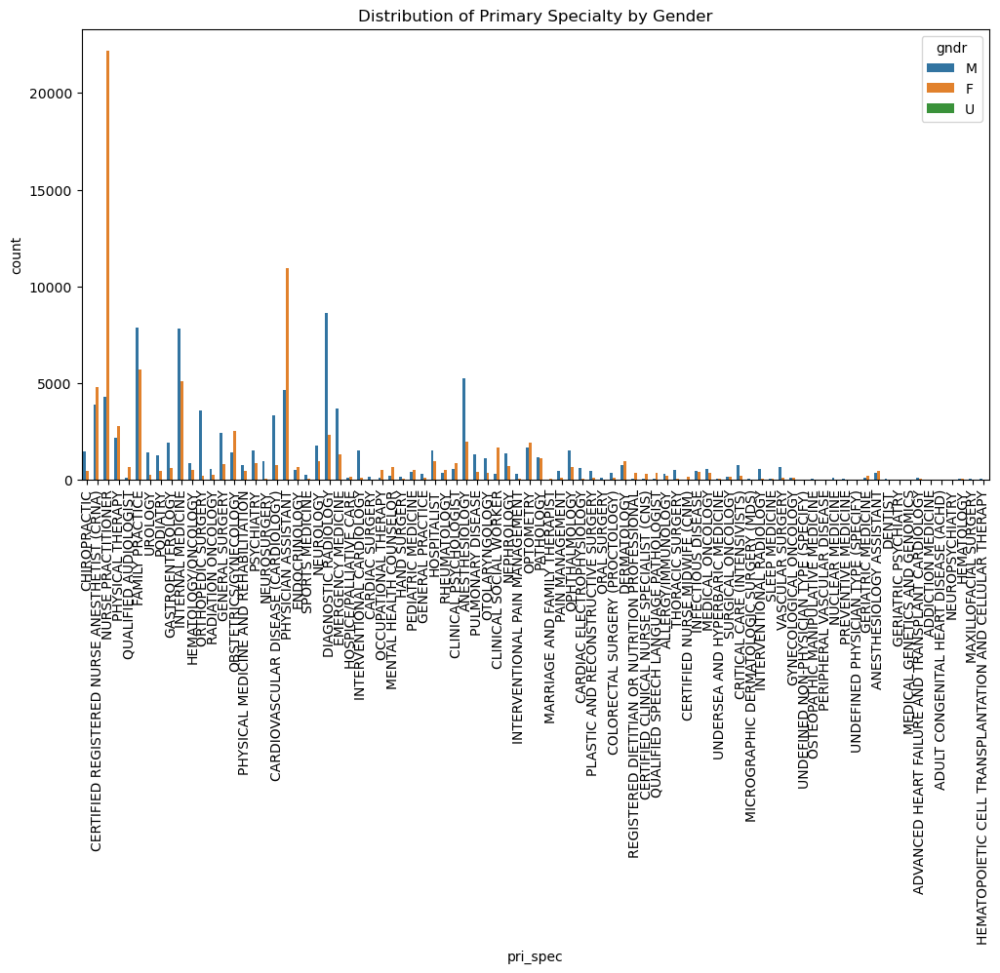

Chi-square statistic: 40890.23967555177, p-value: 0.0


C:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Anaconda\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00         3
           2       0.00      0.00      0.00        32
           3       0.00      0.00      0.00       140
           4       0.00      0.00      0.00      2147
           5       0.00      0.00      0.00       227
           6       0.00      0.00      0.00       207
           7       0.00      0.00      0.00        34
           8       0.00      0.00      0.00      1223
           9       0.00      0.00      0.00        90
          10       0.00      0.00      0.00        33
          11       0.00      0.00      0.00      2599
          12       0.00      0.00      0.00       567
          13       0.00      0.00      0.00       410
          14       0.00      0.00      0.00       597
          15       0.00      0.00      0.00       111
          16       0.00      0.00      0.00       265
          17       0.00      0.00      0.00         6
          18       0.00    

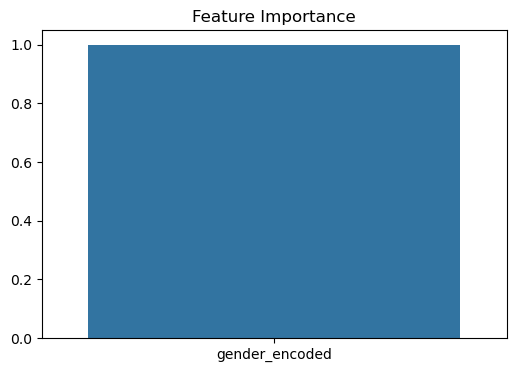

In [22]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
import statsmodels.api as sm

# Handle missing values
texas_data.dropna(subset=['gndr', 'pri_spec'], inplace=True)

# Encode categorical variables
le_gender = LabelEncoder()
le_spec = LabelEncoder()

texas_data['gender_encoded'] = le_gender.fit_transform(texas_data['gndr'])
texas_data['pri_spec_encoded'] = le_spec.fit_transform(texas_data['pri_spec'])

# Step 2: Initial EDA
# Plot the distribution of specialties by gender
plt.figure(figsize=(12, 6))
sns.countplot(data=texas_data, x='pri_spec', hue='gndr')
plt.xticks(rotation=90)
plt.title('Distribution of Primary Specialty by Gender')
plt.show()

# Step 3: Statistical Analysis
# Chi-square test of independence
contingency_table = pd.crosstab(texas_data['gndr'], texas_data['pri_spec'])
chi2, p, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-square statistic: {chi2}, p-value: {p}")

# Step 4: Machine Learning Analysis
# Use RandomForestClassifier to evaluate feature importance
X = texas_data[['gender_encoded']]
y = texas_data['pri_spec_encoded']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

# Feature importance
feature_importance = rf_model.feature_importances_
for feature, importance in zip(X.columns, feature_importance):
    print(f"{feature}: {importance}")

# Visualization of feature importance
plt.figure(figsize=(6, 4))
sns.barplot(x=X.columns, y=feature_importance)
plt.title('Feature Importance')
plt.show()


In [23]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency

# Create a contingency table
contingency_table = pd.crosstab(texas_data['gndr'], texas_data['pri_spec'])

# Perform chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Calculate Cramér's V
n = contingency_table.sum().sum()
cramers_v = np.sqrt(chi2 / (n * (min(contingency_table.shape) - 1)))
print(f"Cramér's V: {cramers_v}")


Cramér's V: 0.34012396571418185


## Do specialty and gender impact where a physician practices?

In [4]:
import pandas as pd

texas_data = pd.read_csv('texas_data.csv')

# rename city/town column to 'city'
texas_data.rename(columns={'City/Town': 'city'}, inplace=True)

texas_data

C:\Users\Nikki Fahrenthold\AppData\Local\Temp\ipykernel_22164\625172129.py:3: DtypeWarning: Columns (23) have mixed types. Specify dtype option on import or set low_memory=False.
  texas_data = pd.read_csv('texas_data.csv')


,NPI,Provider Last Name,Provider First Name,Provider Middle Name,gndr,Cred,Med_sch,Grd_yr,pri_spec,sec_spec_1,...,Telehlth,Facility Name,org_pac_id,num_org_mem,adr_ln_1,adr_ln_2,ln_2_sprs,city,State,ZIP Code
0,1407852924,MELTON,TIMOTHY,S,M,DC,OTHER,1999.0,CHIROPRACTIC,NaN,...,NaN,NaN,NaN,NaN,4601 BUFFALO GAP RD,SUITE C 1,NaN,ABILENE,TX,796053363
1,1073940482,ATHA,JAMES,CARL,M,CNA,OTHER,2013.0,CERTIFIED REGISTERED NURSE ANESTHETIST (CRNA),NaN,...,NaN,PATRIOT ANESTHESIA,6.608139e+09,4.0,1007 2ND ST,NaN,NaN,ABERNATHY,TX,793113615
2,1275512006,NICK,MICHAEL,L,M,CNA,OTHER,1999.0,CERTIFIED REGISTERED NURSE ANESTHETIST (CRNA),NaN,...,NaN,PATRIOT ANESTHESIA,6.608139e+09,4.0,1007 2ND ST,NaN,NaN,ABERNATHY,TX,793113615
3,1659853620,CORTEZ,MARIA,J,F,NP,OTHER,2018.0,NURSE PRACTITIONER,NaN,...,NaN,COVENANT MEDICAL GROUP,6.901889e+09,215.0,409 8TH ST,NaN,NaN,ABERNATHY,TX,793113416
4,1881928299,BLACK,KELLY,J,M,CNA,OTHER,2009.0,CERTIFIED REGISTERED NURSE ANESTHETIST (CRNA),NaN,...,NaN,PATRIOT ANESTHESIA,6.608139e+09,4.0,1007 2ND ST,NaN,NaN,ABERNATHY,TX,793113615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176727,1740517218,DIAZ-FORNO,LAURA,E,F,NaN,OTHER,2000.0,MENTAL HEALTH COUNSELOR,NaN,...,NaN,BORDER REGION MH MR COMMUNITY CENTER,6.482074e+08,16.0,101 1ST ST,NaN,NaN,ZAPATA,TX,780763319
176728,1760762728,MEYERS,ROYCE,LEON,M,PT,OTHER,1954.0,PHYSICAL THERAPY,NaN,...,NaN,"ZAPATA REHABILITATION CENTER, PC",4.385635e+09,2.0,2113 N US HWY 83,NaN,NaN,ZAPATA,TX,780763588
176729,1891405460,ARGUELLES,OLGA,M,F,NP,OTHER,2022.0,NURSE PRACTITIONER,NaN,...,NaN,BORDER REGION MH MR COMMUNITY CENTER,6.482074e+08,16.0,101 1ST ST,NaN,NaN,ZAPATA,TX,780763319
176730,1952657025,HEARD,LISA,H,F,NP,OTHER,2010.0,NURSE PRACTITIONER,NaN,...,NaN,REGIONAL EMPLOYEE ASSISTANCE PROGRAM INC,1.557260e+09,91.0,801 N US HWY 83,NaN,NaN,ZAPATA,TX,780763290


In [5]:
# analysis of specialty & location (city)

import pandas as pd
from scipy.stats import chi2_contingency

# Handle missing values by filling them
texas_data.fillna({'pri_spec': 'Unknown', 'city': 'Unknown'}, inplace=True)

# Create a contingency table
contingency_table = pd.crosstab(texas_data['pri_spec'], texas_data['city'])

# Perform Chi-Square test
chi2, p, dof, ex = chi2_contingency(contingency_table)

print(f"Chi-Square statistic: {chi2}")
print(f"p-value: {p}")
print(f"Degrees of Freedom: {dof}")
print("Expected frequencies:")
print(ex)

if p < 0.05:
    print("There is a significant relationship between 'pri_spec' and 'city'.")
else:
    print("There is no significant relationship between 'pri_spec' and 'city'.")


Chi-Square statistic: 126068.08273126728
p-value: 0.0
Degrees of Freedom: 61030
Expected frequencies:
[[4.41346219e-04 1.04231265e-01 9.19471290e-03 ... 5.14903922e-04
  1.83894258e-03 7.35577032e-05]
 [3.39497092e-05 8.01778965e-03 7.07285608e-04 ... 3.96079940e-05
  1.41457122e-04 5.65828486e-06]
 [3.66656859e-03 8.65921282e-01 7.63868456e-02 ... 4.27766335e-03
  1.52773691e-02 6.11094765e-04]
 ...
 [1.25613924e-03 2.96658217e-01 2.61695675e-02 ... 1.46549578e-03
  5.23391350e-03 2.09356540e-04]
 [5.55417242e-02 1.31171039e+01 1.15711925e+00 ... 6.47986782e-02
  2.31423851e-01 9.25695403e-03]
 [2.52246339e-02 5.95721771e+00 5.25513206e-01 ... 2.94287396e-02
  1.05102641e-01 4.20410565e-03]]
There is a significant relationship between 'pri_spec' and 'city'.


In [6]:
import numpy as np

def cramers_v(chi2, n, min_dim):
    return np.sqrt(chi2 / (n * (min_dim - 1)))

# Calculate Cramér's V
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape)
cramers_v_value = cramers_v(chi2, n, min_dim)

print(f"Cramér's V: {cramers_v_value}")

# Interpretation based on Cramér's V value
if cramers_v_value < 0.1:
    strength = "weak"
elif cramers_v_value < 0.3:
    strength = "moderate"
else:
    strength = "strong"

print(f"The strength of association is {strength}.")

Cramér's V: 0.09160844579191861
The strength of association is weak.


There is a correlation between the primary specialty and location, but it is weak as Cramer's V value measures the strength between two nominal variables.

In [9]:
# same analysis, but with gender and primary specialty

# Handle missing values by filling them
texas_data.fillna({'pri_spec': 'Unknown', 'gndr': 'Unknown'}, inplace=True)

# Create a contingency table
contingency_table = pd.crosstab(texas_data['pri_spec'], texas_data['gndr'])

# Perform Chi-Square test
chi2, p, dof, ex = chi2_contingency(contingency_table)

print(f"Chi-Square statistic: {chi2}")
print(f"p-value: {p}")
print(f"Degrees of Freedom: {dof}")
print("Expected frequencies:")
print(ex)

if p < 0.05:
    print("There is a significant relationship between 'pri_spec' and 'gndr'.")
else:
    print("There is no significant relationship between 'pri_spec' and 'gndr'.")
    

    import numpy as np

def cramers_v(chi2, n, min_dim):
    return np.sqrt(chi2 / (n * (min_dim - 1)))

# Calculate Cramér's V
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape)
cramers_v_value = cramers_v(chi2, n, min_dim)

print(f"Cramér's V: {cramers_v_value}")

# Interpretation based on Cramér's V value
if cramers_v_value < 0.1:
    strength = "weak"
elif cramers_v_value < 0.3:
    strength = "moderate"
else:
    strength = "strong"

print(f"The strength of association is {strength}.")


Chi-Square statistic: 40890.23967555176
p-value: 0.0
Degrees of Freedom: 170
Expected frequencies:
[[6.11396917e+00 6.88588371e+00 1.47115406e-04]
 [4.70305321e-01 5.29683362e-01 1.13165697e-05]
 [5.07929747e+01 5.72058031e+01 1.22218953e-03]
 [2.22454417e+02 2.50540230e+02 5.35273748e-03]
 [3.39043106e+03 3.81848736e+03 8.15811511e-02]
 [3.57432044e+02 4.02559355e+02 8.60059299e-03]
 [3.04287543e+02 3.42705135e+02 7.32182061e-03]
 [6.67833556e+01 7.52150375e+01 1.60695290e-03]
 [1.90379594e+03 2.14415825e+03 4.58094742e-02]
 [1.47675871e+02 1.66320576e+02 3.55340289e-03]
 [5.78475545e+01 6.51510536e+01 1.39193808e-03]
 [4.07425500e+03 4.58864697e+03 9.80354435e-02]
 [8.80411561e+02 9.91567254e+02 2.11846185e-02]
 [6.61719587e+02 7.45264491e+02 1.59224136e-02]
 [9.07689270e+02 1.02228889e+03 2.18409796e-02]
 [2.02231288e+02 2.27763846e+02 4.86612498e-03]
 [4.43027612e+02 4.98961727e+02 1.06602087e-02]
 [1.08170224e+01 1.21827173e+01 2.60281104e-04]
 [7.94815993e+02 8.95164882e+02 1.912

## Is there a correlation between location (city) and gender of a provider?

In [10]:
# same analysis, but with location and gender

# Handle missing values by filling them
texas_data.fillna({'city': 'Unknown', 'gndr': 'Unknown'}, inplace=True)

# Create a contingency table
contingency_table = pd.crosstab(texas_data['city'], texas_data['gndr'])

# Perform Chi-Square test
chi2, p, dof, ex = chi2_contingency(contingency_table)

print(f"Chi-Square statistic: {chi2}")
print(f"p-value: {p}")
print(f"Degrees of Freedom: {dof}")
print("Expected frequencies:")
print(ex)

if p < 0.05:
    print("There is a significant relationship between 'city' and 'gndr'.")
else:
    print("There is no significant relationship between 'city' and 'gndr'.")
    

    import numpy as np

def cramers_v(chi2, n, min_dim):
    return np.sqrt(chi2 / (n * (min_dim - 1)))

# Calculate Cramér's V
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape)
cramers_v_value = cramers_v(chi2, n, min_dim)

print(f"Cramér's V: {cramers_v_value}")

# Interpretation based on Cramér's V value
if cramers_v_value < 0.1:
    strength = "weak"
elif cramers_v_value < 0.3:
    strength = "moderate"
else:
    strength = "strong"

print(f"The strength of association is {strength}.")


Chi-Square statistic: 5640.117608925904
p-value: 0.0
Degrees of Freedom: 1436
Expected frequencies:
[[2.82183193e+00 3.17810017e+00 6.78994183e-05]
 [6.66422640e+02 7.50561324e+02 1.60355793e-02]
 [5.87881651e+01 6.62104203e+01 1.41457122e-03]
 ...
 [3.29213725e+00 3.70778354e+00 7.92159880e-05]
 [1.17576330e+01 1.32420841e+01 2.82914243e-04]
 [4.70305321e-01 5.29683362e-01 1.13165697e-05]]
There is a significant relationship between 'city' and 'gndr'.
Cramér's V: 0.12631981649589583
The strength of association is moderate.


## Post-Hoc Analysis of Massachusetts OBGYN Graduation Rates 

In [2]:
import pandas as pd

ma_data = pd.read_csv('ma_data.csv')
ma_data

C:\Users\Nikki Fahrenthold\AppData\Local\Temp\ipykernel_21872\146536103.py:3: DtypeWarning: Columns (15,26) have mixed types. Specify dtype option on import or set low_memory=False.
  ma_data = pd.read_csv('ma_data.csv')


,NPI,Ind_PAC_ID,Ind_enrl_ID,Provider Last Name,Provider First Name,Provider Middle Name,suff,gndr,Cred,Med_sch,...,adr_ln_1,adr_ln_2,ln_2_sprs,City/Town,State,ZIP Code,Telephone Number,ind_assgn,grp_assgn,adrs_id
0,1003002312,547203192,I20051018001123,HOPKINS,PATRICIA,T,NaN,F,MD,OTHER,...,571 MAIN ST,NaN,NaN,WEYMOUTH,MA,021901843,6.177739e+09,Y,Y,MA021901843WE571XXSTXX300
1,1003003260,1153547724,I20140717001541,TEMPESTA,REGINA,M,NaN,F,CSW,OTHER,...,140 WOOD RD,SUITE 204,NaN,BRAINTREE,MA,021842508,7.813482e+09,Y,M,MA021842508BR140XXRDXX302
2,1003007477,2567558349,I20071010000494,ABDOW,KIMBERLY,B,NaN,F,NP,OTHER,...,435 SHREWSBURY ST,NaN,NaN,WORCESTER,MA,016041689,5.087536e+12,M,M,MA016041689WO435XXSTXX300
3,1003008244,1658544457,I20111021000490,RAJBHANDARI,RUMA,NaN,NaN,F,MD,HARVARD MEDICAL SCHOOL,...,55 FRUIT ST,NaN,NaN,BOSTON,MA,021142696,6.177240e+09,Y,Y,MA021142696BO55XXXSTXX300
4,1003008244,1658544457,I20111021000490,RAJBHANDARI,RUMA,NaN,NaN,F,MD,HARVARD MEDICAL SCHOOL,...,55 FRUIT ST,NaN,NaN,BOSTON,MA,021142621,6.177262e+09,Y,Y,MA021142621BO55XXXSTXX300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69168,1992995195,4981799525,I20070927000690,O'CONNELL,CAROLINE,M,NaN,F,NaN,OTHER,...,1350 MARKET ST,NaN,Y,LYNNFIELD,MA,19404048,7.812134e+09,Y,Y,MA019404048LY1350XSTXX300
69169,1992995195,4981799525,I20070927000690,O'CONNELL,CAROLINE,M,NaN,F,NaN,OTHER,...,15 RAILROAD AVE,NaN,NaN,SOUTH HAMILTON,MA,19822218,9.784687e+09,Y,Y,MA019822218SO15XXXAVEX300
69170,1992995880,8123298577,I20110823000516,STEPHENS,ANDREW,D,NaN,M,NaN,OTHER,...,49 NURSERY LN,SUITE 201,NaN,FITCHBURG,MA,14203576,9.783457e+09,Y,Y,MA014203576FI49XXXLNXX301
69171,1992995989,8224120233,I20070822001042,KELLER,ABIGAIL,S,NaN,F,NaN,OTHER,...,541 MAIN ST,SUITE 418,NaN,WEYMOUTH,MA,21901845,7.813377e+09,Y,Y,MA021901845WE541XXSTXX305


C:\Users\Nikki Fahrenthold\AppData\Local\Temp\ipykernel_21872\3443034610.py:6: DtypeWarning: Columns (15,26) have mixed types. Specify dtype option on import or set low_memory=False.
  ma_data = pd.read_csv('ma_data.csv')


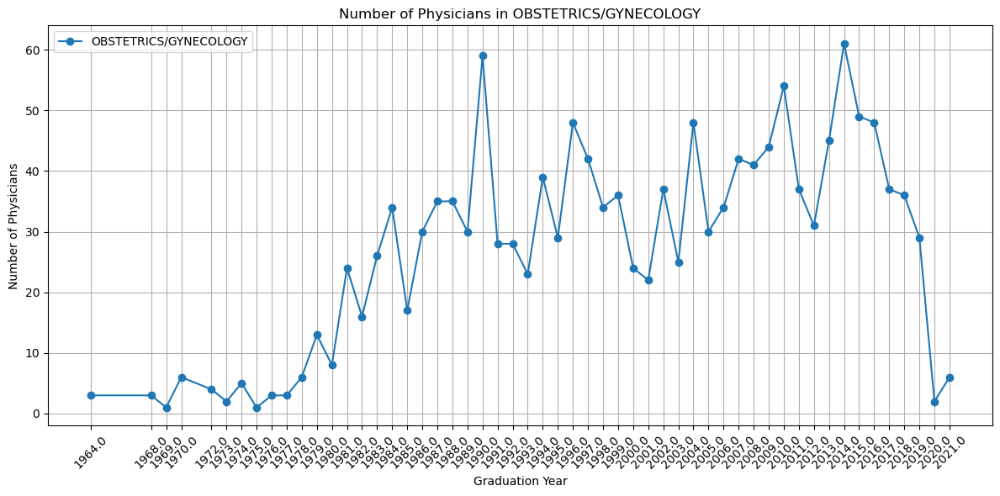

In [3]:
# Code just for OBGYN graduation rates in Mass

import pandas as pd
import matplotlib.pyplot as plt

ma_data = pd.read_csv('ma_data.csv')

def plot_physicians_by_specialty(df):
    # Group by specialty and graduation year, count occurrences
    specialty_counts = df.groupby(['pri_spec', 'Grd_yr']).size().reset_index(name='Count')

    # Filter data for the specific specialty 'OBSTETRICS/GYNECOLOGY'
    specialty = 'OBSTETRICS/GYNECOLOGY'
    data = specialty_counts[specialty_counts['pri_spec'] == specialty]

    # Plot the line graph for the specialty
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(data['Grd_yr'], data['Count'], marker='o', label=specialty)
    ax.set_title(f'Number of Physicians in {specialty}')
    ax.set_xlabel('Graduation Year')
    ax.set_ylabel('Number of Physicians')
    ax.legend()
    ax.grid(True)
    ax.set_xticks(data['Grd_yr'].unique())
    ax.set_xticklabels(data['Grd_yr'].unique(), rotation=45)

    plt.tight_layout()
    plt.show()

plot_physicians_by_specialty(ma_data)


C:\Users\Nikki Fahrenthold\AppData\Local\Temp\ipykernel_21872\1368812648.py:6: DtypeWarning: Columns (15,26) have mixed types. Specify dtype option on import or set low_memory=False.
  ma_data = pd.read_csv('ma_data.csv')


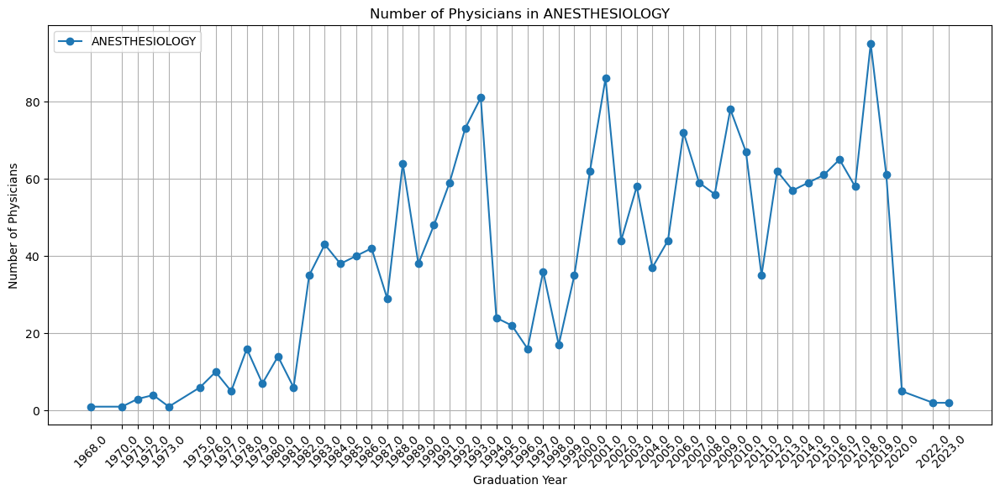

In [4]:
# Code just for Anesthesiology graduation rates in Mass

import pandas as pd
import matplotlib.pyplot as plt

ma_data = pd.read_csv('ma_data.csv')

def plot_physicians_by_specialty(df):
    # Group by specialty and graduation year, count occurrences
    specialty_counts = df.groupby(['pri_spec', 'Grd_yr']).size().reset_index(name='Count')

    # Filter data for the specific specialty 'OBSTETRICS/GYNECOLOGY'
    specialty = 'ANESTHESIOLOGY'
    data = specialty_counts[specialty_counts['pri_spec'] == specialty]

    # Plot the line graph for the specialty
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(data['Grd_yr'], data['Count'], marker='o', label=specialty)
    ax.set_title(f'Number of Physicians in {specialty}')
    ax.set_xlabel('Graduation Year')
    ax.set_ylabel('Number of Physicians')
    ax.legend()
    ax.grid(True)
    ax.set_xticks(data['Grd_yr'].unique())
    ax.set_xticklabels(data['Grd_yr'].unique(), rotation=45)

    plt.tight_layout()
    plt.show()

plot_physicians_by_specialty(ma_data)
